In [1]:
#importig the libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#ignore harmless warnings

import warnings
warnings.filterwarnings("ignore")
#set to display all the columns in dataset

pd.set_option("display.max_columns",None)
import pandasql as psql

In [2]:
#Load the data
BCChurn= pd.read_csv(r"C:\Users\dlc\Desktop\D5\Churn_Modelling1.csv", header = 0)
#copy the backup files
BCChurn_bk1= BCChurn.copy()
#display the first 5 rows
BCChurn.head()

,RowNumber,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [4]:
#Display the information of data
BCChurn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   CreditScore      10000 non-null  int64  
 3   Geography        10000 non-null  object 
 4   Gender           10000 non-null  object 
 5   Age              10000 non-null  int64  
 6   Tenure           10000 non-null  int64  
 7   Balance          10000 non-null  float64
 8   NumOfProducts    10000 non-null  int64  
 9   HasCrCard        10000 non-null  int64  
 10  IsActiveMember   10000 non-null  int64  
 11  EstimatedSalary  10000 non-null  float64
 12  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(2)
memory usage: 1015.8+ KB


In [5]:
#Identify the duplicates
BCChurn_dup=BCChurn[BCChurn.duplicated(keep='last')]
BCChurn_dup

,RowNumber,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited


In [6]:
#Display the information of data
BCChurn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   CreditScore      10000 non-null  int64  
 3   Geography        10000 non-null  object 
 4   Gender           10000 non-null  object 
 5   Age              10000 non-null  int64  
 6   Tenure           10000 non-null  int64  
 7   Balance          10000 non-null  float64
 8   NumOfProducts    10000 non-null  int64  
 9   HasCrCard        10000 non-null  int64  
 10  IsActiveMember   10000 non-null  int64  
 11  EstimatedSalary  10000 non-null  float64
 12  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(2)
memory usage: 1015.8+ KB


In [7]:
#Identify the unique values
BCChurn.nunique()

RowNumber          10000
CustomerId         10000
CreditScore          460
Geography              3
Gender                 2
Age                   70
Tenure                11
Balance             6382
NumOfProducts          4
HasCrCard              2
IsActiveMember         2
EstimatedSalary     9999
Exited                 2
dtype: int64

In [8]:
#Identify the missing values in data
BCChurn.isnull().sum()

RowNumber          0
CustomerId         0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [9]:
#Display ['Gender']categorical value
BCChurn['Gender'].value_counts()

Male      5457
Female    4543
Name: Gender, dtype: int64

In [62]:
#Display ['Geography']categorical value
BCChurn['Geography'].value_counts()

2    5014
1    2509
0    2477
Name: Geography, dtype: int64

In [10]:
BCChurn['Gender']=BCChurn['Gender'].str.replace('Female','0')
BCChurn['Gender']=BCChurn['Gender'].str.replace('Male','1')
BCChurn['Gender']=BCChurn['Gender'].astype(int)

In [11]:
BCChurn['Geography']=BCChurn['Geography'].str.replace('France','2')
BCChurn['Geography']=BCChurn['Geography'].str.replace('Germany','1')
BCChurn['Geography']=BCChurn['Geography'].str.replace('Spain','0')
BCChurn['Geography']=BCChurn['Geography'].astype(int)

In [12]:
# Count the target or dependent variable by '0' & '1' and their proportion 
# (>= 10 : 1, then the dataset is imbalance data)
Exited_count = BCChurn.Exited.value_counts()
print('Class 0:',Exited_count[0])
print('Class 1:',Exited_count[1])
print('propotion:',round(Exited_count[0]/Exited_count[1],2),': 1')
print('Total Churn Modelling records:',len(BCChurn))

Class 0: 7963
Class 1: 2037
propotion: 3.91 : 1
Total Churn Modelling records: 10000


In [14]:
#Identify the independent and target[dependent] variables
IndepVar = []
for col in BCChurn.columns:
    if col != 'Exited':
        IndepVar.append(col)
        
TargetVar = 'Exited'     

x = BCChurn[IndepVar]
y = BCChurn[TargetVar]

In [15]:
#Split the data into train and test (random sampling)

from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Display the shape for train & test data

x_train.shape, x_test.shape, y_train.shape, y_test.shape

((7000, 12), (3000, 12), (7000,), (3000,))

In [16]:
# Scaling the features by using MinMaxScaler

from sklearn.preprocessing import MinMaxScaler

mmscaler = MinMaxScaler(feature_range=(0, 1))

x_train = mmscaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train)

x_test = mmscaler.fit_transform(x_test)
x_test = pd.DataFrame(x_test)

# LOGISTIC REGRESSION

In [17]:
#Logistic regression algorithm
from sklearn.linear_model import LogisticRegression
ModelLR=LogisticRegression()
ModelLR.fit(x_train,y_train)
y_pred=ModelLR.predict(x_test)
y_pred_prob=ModelLR.predict_proba(x_test)

In [18]:
# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

Confusion matrix : 
 [[ 111  473]
 [  73 2343]]


In [19]:
# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

Outcome values : 
 111 473 73 2343
Classification report : 
               precision    recall  f1-score   support

           1       0.60      0.19      0.29       584
           0       0.83      0.97      0.90      2416

    accuracy                           0.82      3000
   macro avg       0.72      0.58      0.59      3000
weighted avg       0.79      0.82      0.78      3000



In [20]:
# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

Accuracy : 81.8 %
Precision : 60.3 %
Recall : 19.0 %
F1 Score : 0.289
Specificity or True Negative Rate : 97.0 %
Balanced Accuracy : 58.0 %
MCC : 0.264


roc_auc_score: 0.58


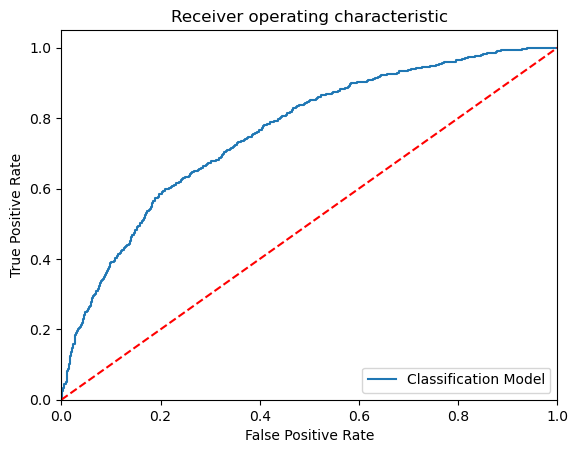

-----------------------------------------------------------------------------------------------------


In [21]:
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelLR.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [22]:
# Define the function to calculate the MAPE - Mean Absolute Percentage Error

def MAPE (y_test, y_pred): 
    y_test, y_pred = np.array(y_test), np.array(y_pred)
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# Evaluation of MAPE 

result = MAPE(y_test, y_pred)
print('Mean Absolute Percentage Error (MAPE):', round(result, 3), '%')

Mean Absolute Percentage Error (MAPE): nan %


In [23]:
#Display the final result
Results=pd.DataFrame({'Exited_A':y_test,'Exited_P':y_pred})
#Merge two dataframes on index of both the dataframes
ResultsFinal=BCChurn_bk1.merge(Results,left_index=True,right_index=True)
#Display the 5 records
ResultsFinal.sample(5)

,RowNumber,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Exited_A,Exited_P
5894,5895,15648067,583,France,Male,39,1,129299.28,2,1,0,73107.60,0,0,0
7434,7435,15687527,638,Spain,Male,35,1,0.00,2,1,0,165370.66,0,0,0
3615,3616,15639357,415,France,Male,46,9,134950.19,3,0,0,178587.36,1,1,0
4237,4238,15736271,498,France,Female,29,9,0.00,1,1,0,190035.83,0,0,0
3299,3300,15724527,825,France,Male,34,9,0.00,2,1,1,31933.06,0,0,0


# DECISION TREE

In [24]:
# decision tree Algorithm
from sklearn.tree import DecisionTreeClassifier
ModelDT=DecisionTreeClassifier()
ModelDT.fit(x_train,y_train)
y_pred=ModelDT.predict(x_test)
y_pred_prob=ModelDT.predict_proba(x_test)

Confusion matrix : 
 [[ 296  288]
 [ 357 2059]]
Outcome values : 
 296 288 357 2059
Classification report : 
               precision    recall  f1-score   support

           1       0.45      0.51      0.48       584
           0       0.88      0.85      0.86      2416

    accuracy                           0.79      3000
   macro avg       0.67      0.68      0.67      3000
weighted avg       0.79      0.79      0.79      3000

Accuracy : 78.5 %
Precision : 45.3 %
Recall : 50.7 %
F1 Score : 0.479
Specificity or True Negative Rate : 85.2 %
Balanced Accuracy : 68.0 %
MCC : 0.345
roc_auc_score: 0.68


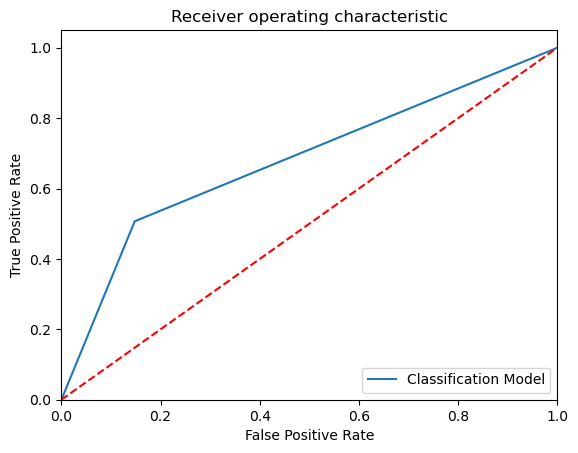

-----------------------------------------------------------------------------------------------------


In [25]:
# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)
# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);
# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelDT.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [26]:
#Display the final result
Results=pd.DataFrame({'Exited_A':y_test,'Exited_P':y_pred})
#Merge two dataframes on index of both the dataframes
ResultsFinal=BCChurn_bk1.merge(Results,left_index=True,right_index=True)
# Display the 5 records
ResultsFinal.sample(5)

,RowNumber,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Exited_A,Exited_P
6866,6867,15664506,675,Spain,Male,32,8,197436.82,1,1,1,52710.70,0,0,0
9516,9517,15770567,557,France,Female,32,3,123502.53,1,1,1,69826.80,0,0,0
4766,4767,15719858,659,Spain,Female,38,9,0.00,2,1,1,35701.06,0,0,0
4048,4049,15653715,602,France,Female,63,7,0.00,2,1,1,56323.21,0,0,0
8704,8705,15777586,784,Spain,Female,42,2,109052.04,2,1,0,6409.55,0,0,0


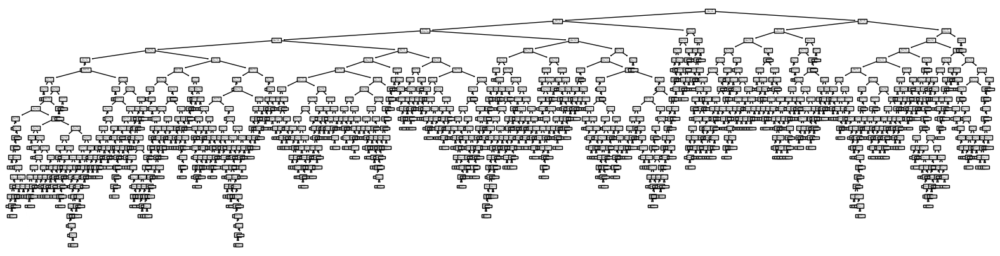

In [28]:
#Plot the tree
import matplotlib.pyplot as plt
from sklearn import tree

plt.figure(figsize=(20,5))
tree.plot_tree(ModelDT);

# RANDOM FOREST

In [29]:
# Random Forest Algorithm
from sklearn.ensemble  import RandomForestClassifier
ModelRF=RandomForestClassifier()
ModelRF.fit(x_train,y_train)
y_pred=ModelRF.predict(x_test)
y_pred_prob=ModelRF.predict_proba(x_test)

In [30]:
#Display the algorithm hyper parameters
params = ModelRF.get_params()
print(params)

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


Confusion matrix : 
 [[ 262  322]
 [  78 2338]]
Outcome values : 
 262 322 78 2338
Classification report : 
               precision    recall  f1-score   support

           1       0.77      0.45      0.57       584
           0       0.88      0.97      0.92      2416

    accuracy                           0.87      3000
   macro avg       0.82      0.71      0.74      3000
weighted avg       0.86      0.87      0.85      3000

Accuracy : 86.7 %
Precision : 77.1 %
Recall : 44.9 %
F1 Score : 0.567
Specificity or True Negative Rate : 96.8 %
Balanced Accuracy : 70.8 %
MCC : 0.52
roc_auc_score: 0.708


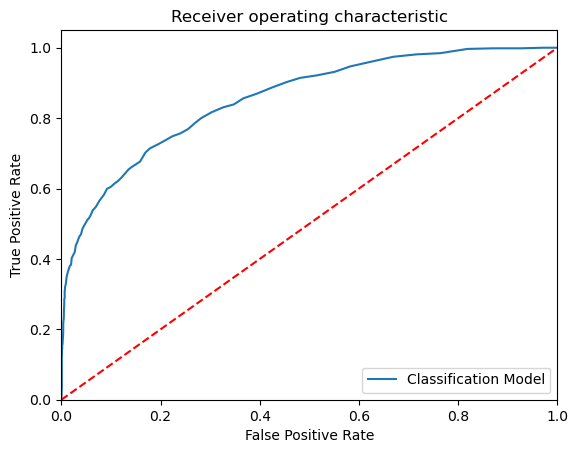

-----------------------------------------------------------------------------------------------------


In [31]:
# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# Actual values

actual = y_test

# Predicted values

predicted = y_pred

# Confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0], sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)
# Outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# Classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);
# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%')
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)
# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelRF.predict_proba(x_test)[:,1])
plt.figure()
#----------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [32]:
#Display the final result
Results=pd.DataFrame({'Exited_A':y_test,'Exited_P':y_pred})
#Merge two dataframes on index of both the dataframes
ResultsFinal=BCChurn_bk1.merge(Results,left_index=True,right_index=True)
# Display the 5 records
ResultsFinal.sample(5)

,RowNumber,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Exited_A,Exited_P
7396,7397,15603565,603,Spain,Female,56,5,90778.76,2,1,0,162223.67,1,1,1
2724,2725,15812628,453,Germany,Female,38,8,120623.21,1,1,0,129697.99,0,0,0
7300,7301,15788224,669,Germany,Male,45,1,123949.75,1,0,0,110881.56,0,0,1
6603,6604,15683213,554,France,Female,35,10,74988.59,2,0,1,190155.13,0,0,0
2083,2084,15779738,534,France,Male,24,1,0.00,1,1,1,169653.32,0,0,0


# EXTRA TREE

Confusion matrix : 
 [[ 244  340]
 [  65 2351]]
Outcome values : 
 244 340 65 2351
Classification report : 
               precision    recall  f1-score   support

           1       0.79      0.42      0.55       584
           0       0.87      0.97      0.92      2416

    accuracy                           0.86      3000
   macro avg       0.83      0.70      0.73      3000
weighted avg       0.86      0.86      0.85      3000

Accuracy : 86.5 %
Precision : 79.0 %
Recall : 41.8 %
F1 Score : 0.546
Specificity or True Negative Rate : 97.3 %
Balanced Accuracy : 69.6 %
MCC : 0.509
roc_auc_score: 0.695


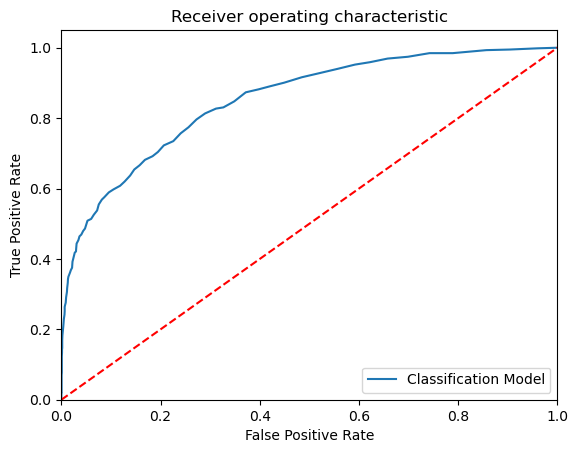

-----------------------------------------------------------------------------------------------------


In [33]:
#==Step_01=============================================================================================================>

# To build the 'Random Forest' model with random sampling

from sklearn.ensemble import ExtraTreesClassifier

# Create an object for Extra Trees Classifier 

ModelET = ExtraTreesClassifier()

# Train the model with train data 

ModelET.fit(x_train,y_train)

# Predict the model with test data set

y_pred = ModelET.predict(x_test)
y_pred_prob = ModelET.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual, predicted, labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual, ModelET.predict_proba(x_test)[:,1])
plt.figure()
#--------------------------------------------------------------------
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

In [3]:
#Display the columns
BCChurn.columns

Index(['RowNumber', 'CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age',
       'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited'],
      dtype='object')

In [4]:
#create list for plotting the decision tree
figcols=['RowNumber', 'CustomerId', 'CreditScore', 'Geography', 'Gender', 'Age',
       'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember',
       'EstimatedSalary', 'Exited']

In [44]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Extra Trees Classifier

from sklearn import tree

fn2=figcols
cn2=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000)
for index in range(0, 5):
    tree.plot_tree(ModelET.estimators_[index],
                   feature_names = fn2, 
                   class_names=cn2,
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('ModelET1.png')

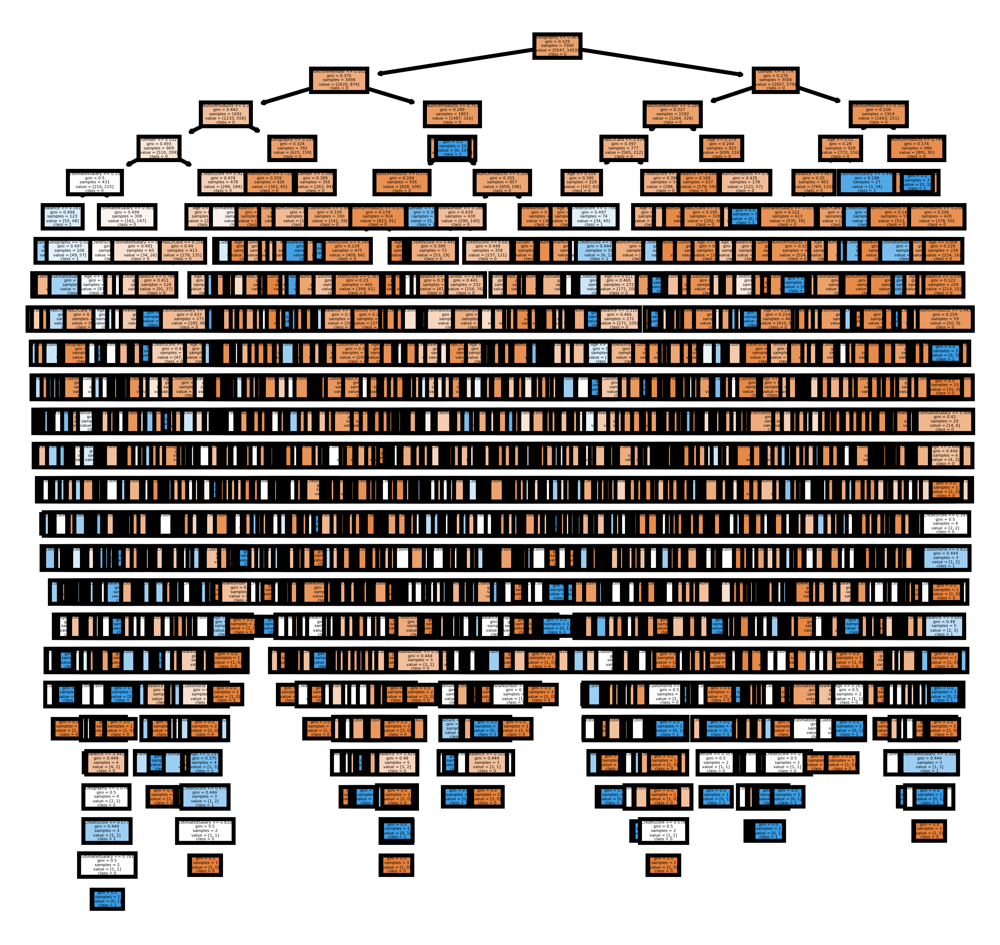

In [45]:
# Visualize individual trees and code below visualizes the first decision tree of Extra Trees Classifier

from sklearn import tree

fn1=figcols
cn1=['0', '1']

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (4,4), dpi=800)
tree.plot_tree(ModelET.estimators_[0],
               feature_names = fn1, 
               class_names=cn1,
               filled = True);
#fig.savefig('ModelET.png')

# KNN 

In [41]:
#Load the data
KNN_Results=pd.read_csv(r"C:\Users\dlc\Desktop\D5\KNN_Results.csv",header=0)
#Display the data
KNN_Results.head()

,Model Name,KNN K Value,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


KNN_K_value =  1
Model Name:  KNeighborsClassifier(n_neighbors=1)
Confusion matrix : 
 [[ 210  374]
 [ 304 2112]]
Outcome values : 
 210 374 304 2112
Classification report : 
               precision    recall  f1-score   support

           1       0.41      0.36      0.38       584
           0       0.85      0.87      0.86      2416

    accuracy                           0.77      3000
   macro avg       0.63      0.62      0.62      3000
weighted avg       0.76      0.77      0.77      3000

Accuracy : 77.4 %
Precision : 40.9 %
Recall : 36.0 %
F1 Score : 0.383
Specificity or True Negative Rate : 87.4 %
Balanced Accuracy : 61.7 %
MCC : 0.246
roc_auc_score: 0.617


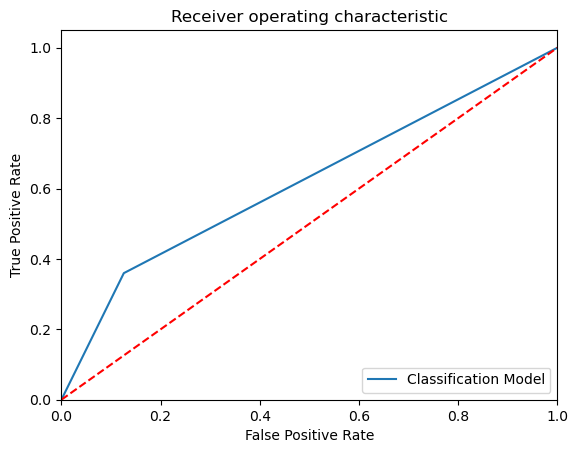

KNN_K_value =  2
Model Name:  KNeighborsClassifier(n_neighbors=2)
Confusion matrix : 
 [[  90  494]
 [  86 2330]]
Outcome values : 
 90 494 86 2330
Classification report : 
               precision    recall  f1-score   support

           1       0.51      0.15      0.24       584
           0       0.83      0.96      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.67      0.56      0.56      3000
weighted avg       0.76      0.81      0.76      3000

Accuracy : 80.7 %
Precision : 51.1 %
Recall : 15.4 %
F1 Score : 0.237
Specificity or True Negative Rate : 96.4 %
Balanced Accuracy : 55.9 %
MCC : 0.2
roc_auc_score: 0.559


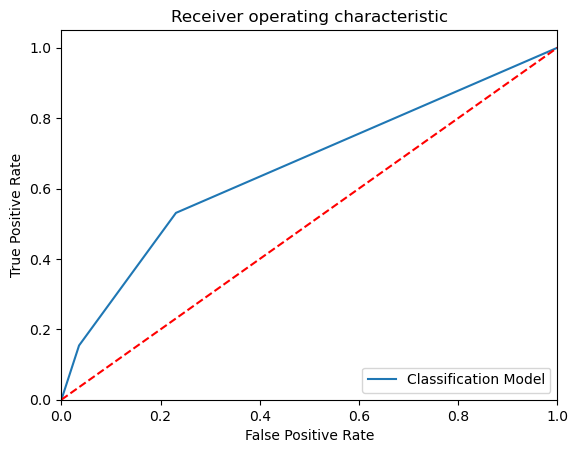

KNN_K_value =  3
Model Name:  KNeighborsClassifier(n_neighbors=3)
Confusion matrix : 
 [[ 164  420]
 [ 185 2231]]
Outcome values : 
 164 420 185 2231
Classification report : 
               precision    recall  f1-score   support

           1       0.47      0.28      0.35       584
           0       0.84      0.92      0.88      2416

    accuracy                           0.80      3000
   macro avg       0.66      0.60      0.62      3000
weighted avg       0.77      0.80      0.78      3000

Accuracy : 79.8 %
Precision : 47.0 %
Recall : 28.1 %
F1 Score : 0.352
Specificity or True Negative Rate : 92.3 %
Balanced Accuracy : 60.2 %
MCC : 0.252
roc_auc_score: 0.602


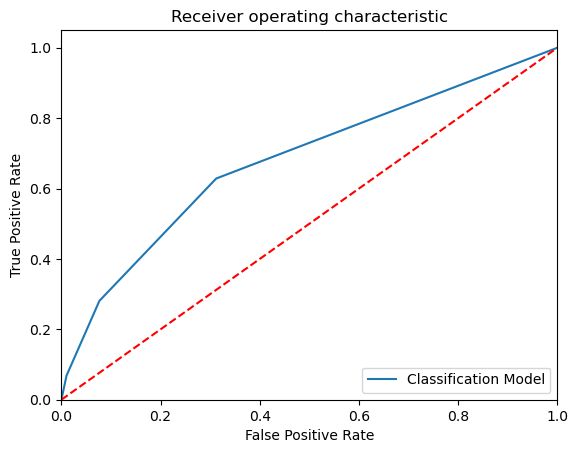

KNN_K_value =  4
Model Name:  KNeighborsClassifier(n_neighbors=4)
Confusion matrix : 
 [[  80  504]
 [  74 2342]]
Outcome values : 
 80 504 74 2342
Classification report : 
               precision    recall  f1-score   support

           1       0.52      0.14      0.22       584
           0       0.82      0.97      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.67      0.55      0.55      3000
weighted avg       0.76      0.81      0.76      3000

Accuracy : 80.7 %
Precision : 51.9 %
Recall : 13.7 %
F1 Score : 0.217
Specificity or True Negative Rate : 96.9 %
Balanced Accuracy : 55.3 %
MCC : 0.191
roc_auc_score: 0.553


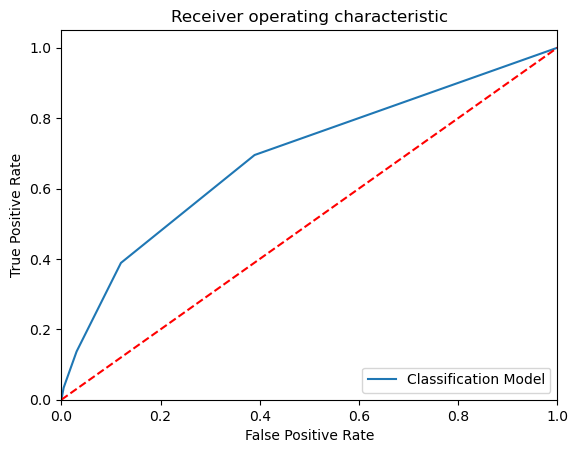

KNN_K_value =  5
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[ 125  459]
 [ 127 2289]]
Outcome values : 
 125 459 127 2289
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.21      0.30       584
           0       0.83      0.95      0.89      2416

    accuracy                           0.80      3000
   macro avg       0.66      0.58      0.59      3000
weighted avg       0.77      0.80      0.77      3000

Accuracy : 80.5 %
Precision : 49.6 %
Recall : 21.4 %
F1 Score : 0.299
Specificity or True Negative Rate : 94.7 %
Balanced Accuracy : 58.0 %
MCC : 0.23
roc_auc_score: 0.581


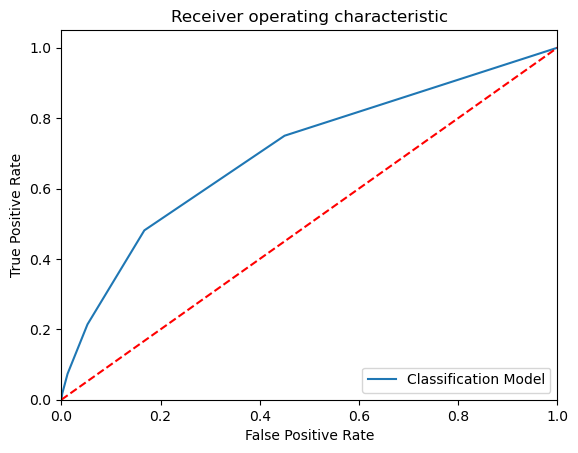

KNN_K_value =  6
Model Name:  KNeighborsClassifier(n_neighbors=6)
Confusion matrix : 
 [[  75  509]
 [  58 2358]]
Outcome values : 
 75 509 58 2358
Classification report : 
               precision    recall  f1-score   support

           1       0.56      0.13      0.21       584
           0       0.82      0.98      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.69      0.55      0.55      3000
weighted avg       0.77      0.81      0.76      3000

Accuracy : 81.1 %
Precision : 56.4 %
Recall : 12.8 %
F1 Score : 0.209
Specificity or True Negative Rate : 97.6 %
Balanced Accuracy : 55.2 %
MCC : 0.201
roc_auc_score: 0.552


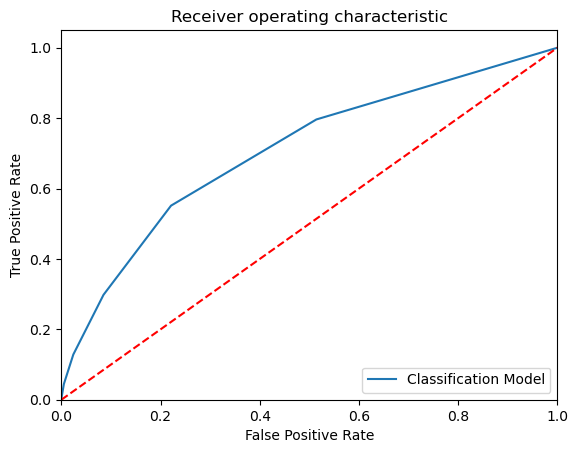

KNN_K_value =  7
Model Name:  KNeighborsClassifier(n_neighbors=7)
Confusion matrix : 
 [[ 123  461]
 [ 105 2311]]
Outcome values : 
 123 461 105 2311
Classification report : 
               precision    recall  f1-score   support

           1       0.54      0.21      0.30       584
           0       0.83      0.96      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.69      0.58      0.60      3000
weighted avg       0.78      0.81      0.78      3000

Accuracy : 81.1 %
Precision : 53.9 %
Recall : 21.1 %
F1 Score : 0.303
Specificity or True Negative Rate : 95.7 %
Balanced Accuracy : 58.4 %
MCC : 0.25
roc_auc_score: 0.584


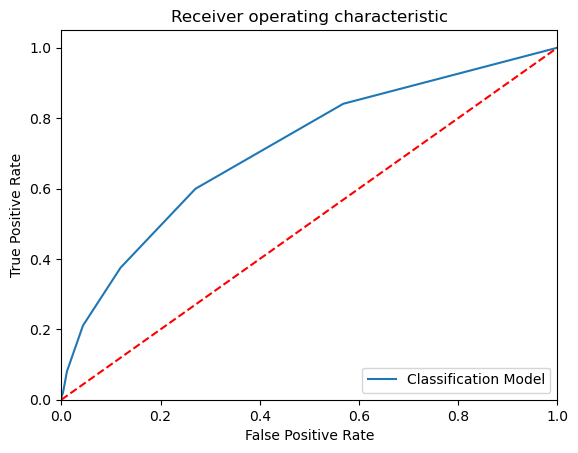

KNN_K_value =  8
Model Name:  KNeighborsClassifier(n_neighbors=8)
Confusion matrix : 
 [[  74  510]
 [  46 2370]]
Outcome values : 
 74 510 46 2370
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.13      0.21       584
           0       0.82      0.98      0.90      2416

    accuracy                           0.81      3000
   macro avg       0.72      0.55      0.55      3000
weighted avg       0.78      0.81      0.76      3000

Accuracy : 81.5 %
Precision : 61.7 %
Recall : 12.7 %
F1 Score : 0.21
Specificity or True Negative Rate : 98.1 %
Balanced Accuracy : 55.4 %
MCC : 0.218
roc_auc_score: 0.554


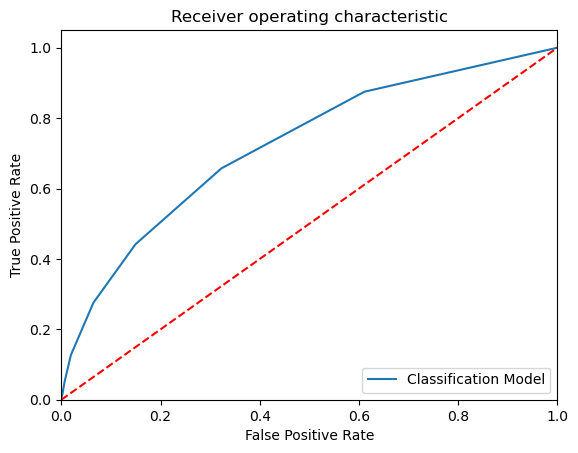

KNN_K_value =  9
Model Name:  KNeighborsClassifier(n_neighbors=9)
Confusion matrix : 
 [[ 102  482]
 [  79 2337]]
Outcome values : 
 102 482 79 2337
Classification report : 
               precision    recall  f1-score   support

           1       0.56      0.17      0.27       584
           0       0.83      0.97      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.70      0.57      0.58      3000
weighted avg       0.78      0.81      0.77      3000

Accuracy : 81.3 %
Precision : 56.4 %
Recall : 17.5 %
F1 Score : 0.267
Specificity or True Negative Rate : 96.7 %
Balanced Accuracy : 57.1 %
MCC : 0.236
roc_auc_score: 0.571


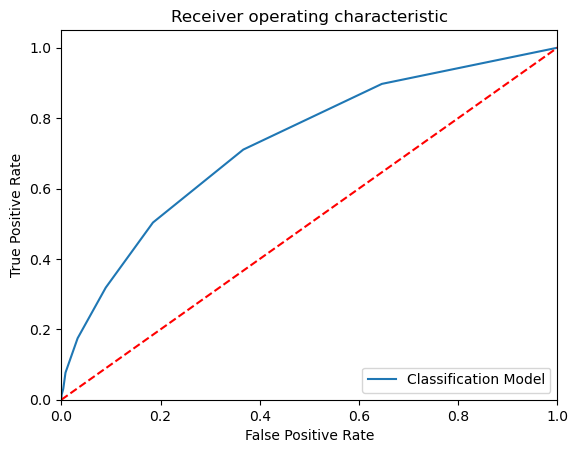

KNN_K_value =  10
Model Name:  KNeighborsClassifier(n_neighbors=10)
Confusion matrix : 
 [[  53  531]
 [  36 2380]]
Outcome values : 
 53 531 36 2380
Classification report : 
               precision    recall  f1-score   support

           1       0.60      0.09      0.16       584
           0       0.82      0.99      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.71      0.54      0.53      3000
weighted avg       0.77      0.81      0.75      3000

Accuracy : 81.1 %
Precision : 59.6 %
Recall : 9.1 %
F1 Score : 0.158
Specificity or True Negative Rate : 98.5 %
Balanced Accuracy : 53.8 %
MCC : 0.177
roc_auc_score: 0.538


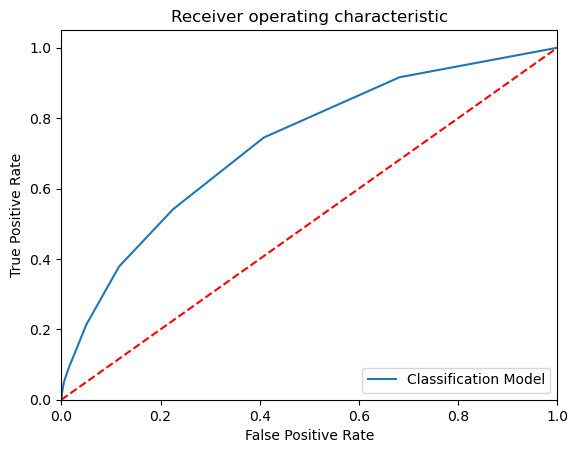

KNN_K_value =  11
Model Name:  KNeighborsClassifier(n_neighbors=11)
Confusion matrix : 
 [[  84  500]
 [  73 2343]]
Outcome values : 
 84 500 73 2343
Classification report : 
               precision    recall  f1-score   support

           1       0.54      0.14      0.23       584
           0       0.82      0.97      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.68      0.56      0.56      3000
weighted avg       0.77      0.81      0.76      3000

Accuracy : 80.9 %
Precision : 53.5 %
Recall : 14.4 %
F1 Score : 0.227
Specificity or True Negative Rate : 97.0 %
Balanced Accuracy : 55.7 %
MCC : 0.202
roc_auc_score: 0.557


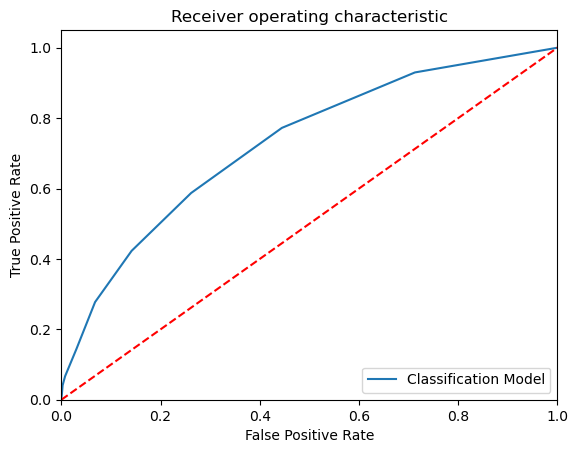

KNN_K_value =  12
Model Name:  KNeighborsClassifier(n_neighbors=12)
Confusion matrix : 
 [[  49  535]
 [  34 2382]]
Outcome values : 
 49 535 34 2382
Classification report : 
               precision    recall  f1-score   support

           1       0.59      0.08      0.15       584
           0       0.82      0.99      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.70      0.53      0.52      3000
weighted avg       0.77      0.81      0.75      3000

Accuracy : 81.0 %
Precision : 59.0 %
Recall : 8.4 %
F1 Score : 0.147
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 53.5 %
MCC : 0.169
roc_auc_score: 0.535


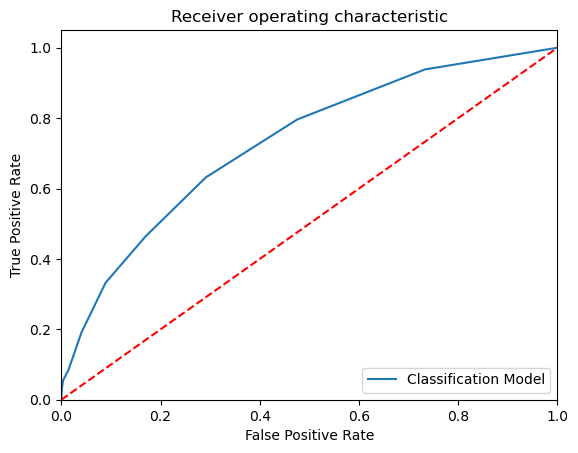

KNN_K_value =  13
Model Name:  KNeighborsClassifier(n_neighbors=13)
Confusion matrix : 
 [[  70  514]
 [  54 2362]]
Outcome values : 
 70 514 54 2362
Classification report : 
               precision    recall  f1-score   support

           1       0.56      0.12      0.20       584
           0       0.82      0.98      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.69      0.55      0.55      3000
weighted avg       0.77      0.81      0.76      3000

Accuracy : 81.1 %
Precision : 56.5 %
Recall : 12.0 %
F1 Score : 0.198
Specificity or True Negative Rate : 97.8 %
Balanced Accuracy : 54.9 %
MCC : 0.194
roc_auc_score: 0.549


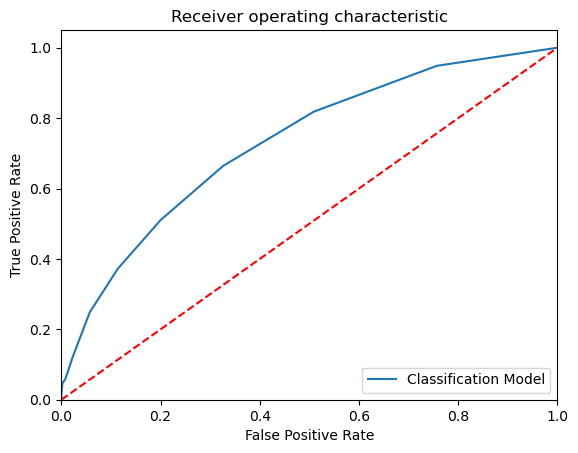

KNN_K_value =  14
Model Name:  KNeighborsClassifier(n_neighbors=14)
Confusion matrix : 
 [[  46  538]
 [  34 2382]]
Outcome values : 
 46 538 34 2382
Classification report : 
               precision    recall  f1-score   support

           1       0.57      0.08      0.14       584
           0       0.82      0.99      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.70      0.53      0.52      3000
weighted avg       0.77      0.81      0.75      3000

Accuracy : 80.9 %
Precision : 57.5 %
Recall : 7.9 %
F1 Score : 0.139
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 53.2 %
MCC : 0.159
roc_auc_score: 0.532


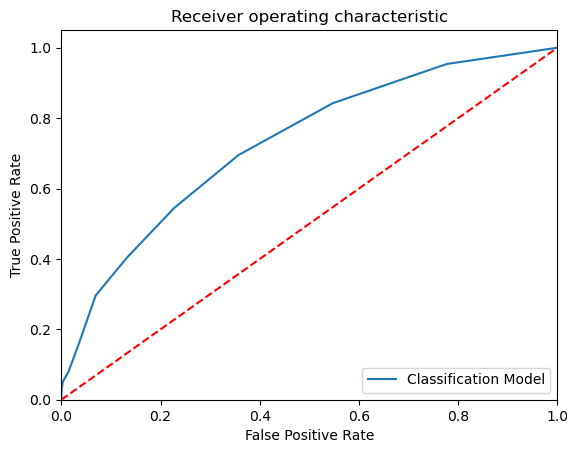

KNN_K_value =  15
Model Name:  KNeighborsClassifier(n_neighbors=15)
Confusion matrix : 
 [[  62  522]
 [  56 2360]]
Outcome values : 
 62 522 56 2360
Classification report : 
               precision    recall  f1-score   support

           1       0.53      0.11      0.18       584
           0       0.82      0.98      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.67      0.54      0.53      3000
weighted avg       0.76      0.81      0.75      3000

Accuracy : 80.7 %
Precision : 52.5 %
Recall : 10.6 %
F1 Score : 0.177
Specificity or True Negative Rate : 97.7 %
Balanced Accuracy : 54.2 %
MCC : 0.169
roc_auc_score: 0.541


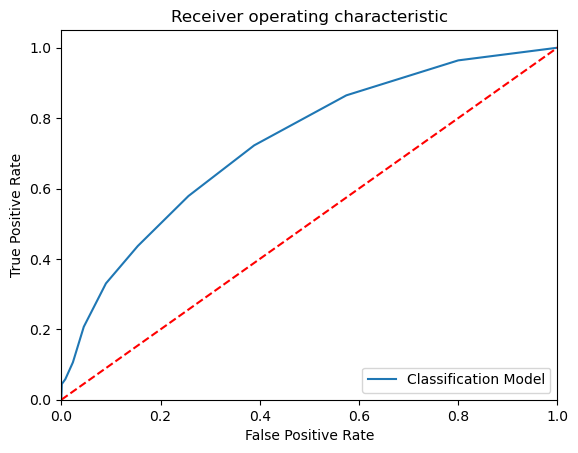

KNN_K_value =  16
Model Name:  KNeighborsClassifier(n_neighbors=16)
Confusion matrix : 
 [[  44  540]
 [  27 2389]]
Outcome values : 
 44 540 27 2389
Classification report : 
               precision    recall  f1-score   support

           1       0.62      0.08      0.13       584
           0       0.82      0.99      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.72      0.53      0.51      3000
weighted avg       0.78      0.81      0.75      3000

Accuracy : 81.1 %
Precision : 62.0 %
Recall : 7.5 %
F1 Score : 0.134
Specificity or True Negative Rate : 98.9 %
Balanced Accuracy : 53.2 %
MCC : 0.167
roc_auc_score: 0.532


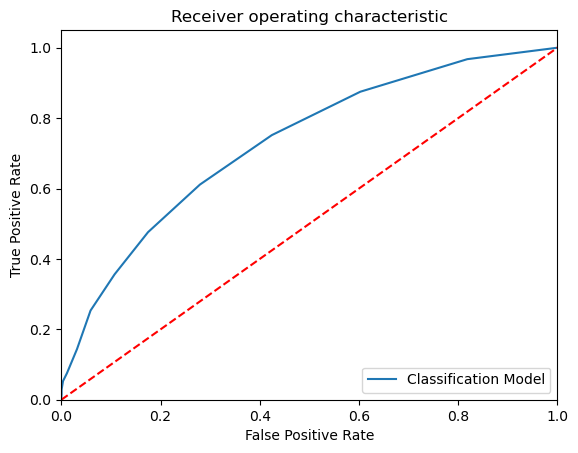

KNN_K_value =  17
Model Name:  KNeighborsClassifier(n_neighbors=17)
Confusion matrix : 
 [[  59  525]
 [  44 2372]]
Outcome values : 
 59 525 44 2372
Classification report : 
               precision    recall  f1-score   support

           1       0.57      0.10      0.17       584
           0       0.82      0.98      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.70      0.54      0.53      3000
weighted avg       0.77      0.81      0.75      3000

Accuracy : 81.0 %
Precision : 57.3 %
Recall : 10.1 %
F1 Score : 0.172
Specificity or True Negative Rate : 98.2 %
Balanced Accuracy : 54.2 %
MCC : 0.18
roc_auc_score: 0.541


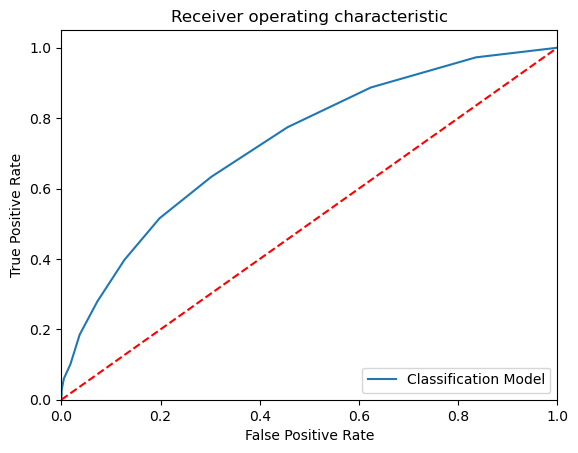

KNN_K_value =  18
Model Name:  KNeighborsClassifier(n_neighbors=18)
Confusion matrix : 
 [[  43  541]
 [  23 2393]]
Outcome values : 
 43 541 23 2393
Classification report : 
               precision    recall  f1-score   support

           1       0.65      0.07      0.13       584
           0       0.82      0.99      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.73      0.53      0.51      3000
weighted avg       0.78      0.81      0.75      3000

Accuracy : 81.2 %
Precision : 65.2 %
Recall : 7.4 %
F1 Score : 0.132
Specificity or True Negative Rate : 99.0 %
Balanced Accuracy : 53.2 %
MCC : 0.173
roc_auc_score: 0.532


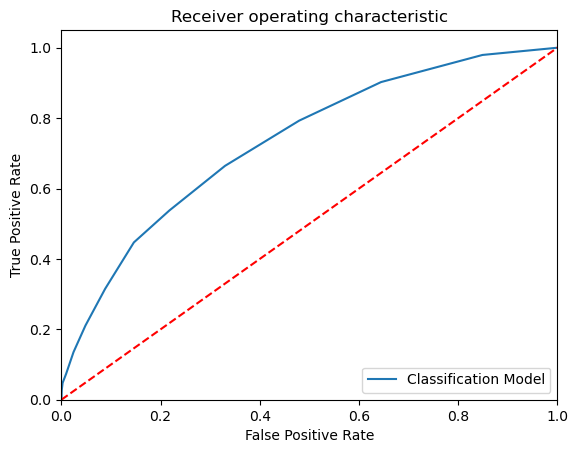

KNN_K_value =  19
Model Name:  KNeighborsClassifier(n_neighbors=19)
Confusion matrix : 
 [[  56  528]
 [  33 2383]]
Outcome values : 
 56 528 33 2383
Classification report : 
               precision    recall  f1-score   support

           1       0.63      0.10      0.17       584
           0       0.82      0.99      0.89      2416

    accuracy                           0.81      3000
   macro avg       0.72      0.54      0.53      3000
weighted avg       0.78      0.81      0.75      3000

Accuracy : 81.3 %
Precision : 62.9 %
Recall : 9.6 %
F1 Score : 0.166
Specificity or True Negative Rate : 98.6 %
Balanced Accuracy : 54.1 %
MCC : 0.192
roc_auc_score: 0.541


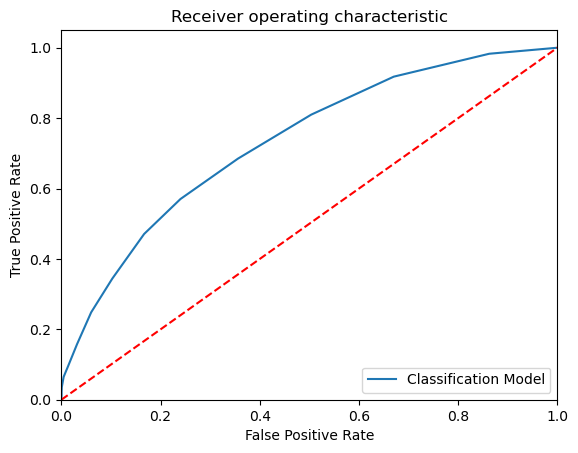

KNN_K_value =  20
Model Name:  KNeighborsClassifier(n_neighbors=20)
Confusion matrix : 
 [[  45  539]
 [  19 2397]]
Outcome values : 
 45 539 19 2397
Classification report : 
               precision    recall  f1-score   support

           1       0.70      0.08      0.14       584
           0       0.82      0.99      0.90      2416

    accuracy                           0.81      3000
   macro avg       0.76      0.53      0.52      3000
weighted avg       0.79      0.81      0.75      3000

Accuracy : 81.4 %
Precision : 70.3 %
Recall : 7.7 %
F1 Score : 0.139
Specificity or True Negative Rate : 99.2 %
Balanced Accuracy : 53.4 %
MCC : 0.19
roc_auc_score: 0.535


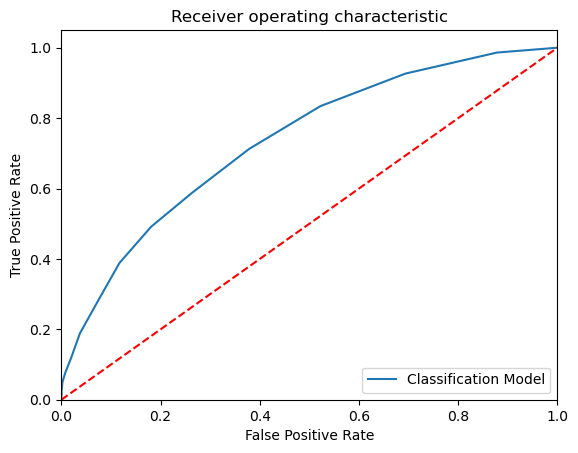

In [42]:
# Build KNN Model

from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import sklearn.metrics as metrics

from sklearn.metrics import roc_curve, roc_auc_score

accuracy = []

for a in range(1, 21, 1):
    
    k = a
    
    # Build the model
    
    ModelKNN = KNeighborsClassifier(n_neighbors=k)
    
    # Train the model
    
    ModelKNN.fit(x_train, y_train)
    
    # Predict the model
    
    y_pred = ModelKNN.predict(x_test)
    y_pred_prob = ModelKNN.predict_proba(x_test)
    
    print('KNN_K_value = ', a)
    
    # Print the model name
    
    print('Model Name: ', ModelKNN)
    
    # confusion matrix in sklearn
    
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report
    
    # actual values
    
    actual = y_test
    
    # predicted values
    
    predicted = y_pred
    
    # confusion matrix
    
    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)
    
    # outcome values order in sklearn
    
    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)
    
    # classification report for precision, recall f1-score and accuracy
    
    C_Report = classification_report(actual,predicted,labels=[1,0])
    
    print('Classification report : \n', C_Report)
    
    # calculating the metrics
    
    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);
    
    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model
    
    from math import sqrt
    
    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)
    
    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)
    
    # Area under ROC curve 
    
    from sklearn.metrics import roc_curve, roc_auc_score
    
    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, ModelKNN.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    plt.show()
    #------------------------------------------------------------------------------
    new_row = {'Model Name' : ModelKNN,
               'KNN K Value' : a,
               'True_Positive' : tp,
               'False_Negative' : fn,
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    KNN_Results = KNN_Results.append(new_row, ignore_index=True)
    #------KNN_Results------------------------------------------------------------------------


# NAIVE BAYES

Confusion matrix : 
 [[ 156  428]
 [  62 2354]]
Outcome values : 
 156 428 62 2354
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.27      0.39       584
           0       0.85      0.97      0.91      2416

    accuracy                           0.84      3000
   macro avg       0.78      0.62      0.65      3000
weighted avg       0.82      0.84      0.81      3000

Accuracy : 83.7 %
Precision : 71.6 %
Recall : 26.7 %
F1 Score : 0.389
Specificity or True Negative Rate : 97.4 %
Balanced Accuracy : 62.0 %
MCC : 0.368
roc_auc_score: 0.621


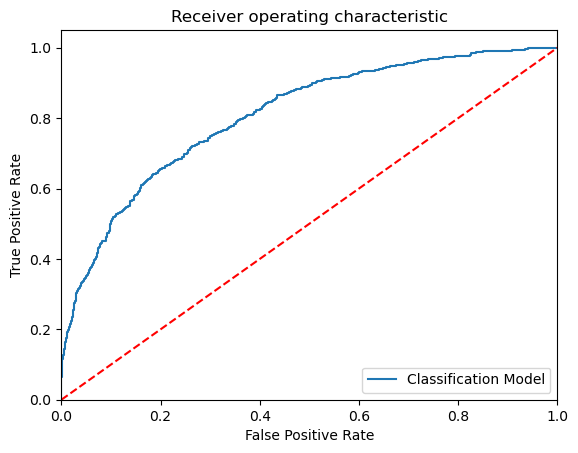

-----------------------------------------------------------------------------------------------------


In [68]:
# Training the Naive Bayes model (GaussianNB) on the Training set

from sklearn.naive_bayes import GaussianNB

modelGNB = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model with train data

modelGNB.fit(x_train,y_train)

# Predict the model with test data set

y_pred = modelGNB.predict(x_test)
y_pred_prob = modelGNB.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,modelGNB.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

# SVM

In [54]:
#Load the data
EMResults1=pd.read_csv(r"C:\Users\dlc\Desktop\D5\EMResults (1).csv",header=0)
#Display the data
EMResults1.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Confusion matrix : 
 [[ 156  428]
 [  62 2354]]
Outcome values : 
 156 428 62 2354
Classification report : 
               precision    recall  f1-score   support

           1       0.72      0.27      0.39       584
           0       0.85      0.97      0.91      2416

    accuracy                           0.84      3000
   macro avg       0.78      0.62      0.65      3000
weighted avg       0.82      0.84      0.81      3000

Accuracy : 83.7 %
Precision : 71.6 %
Recall : 26.7 %
F1 Score : 0.389
Specificity or True Negative Rate : 97.4 %
Balanced Accuracy : 62.0 %
MCC : 0.368
roc_auc_score: 0.621


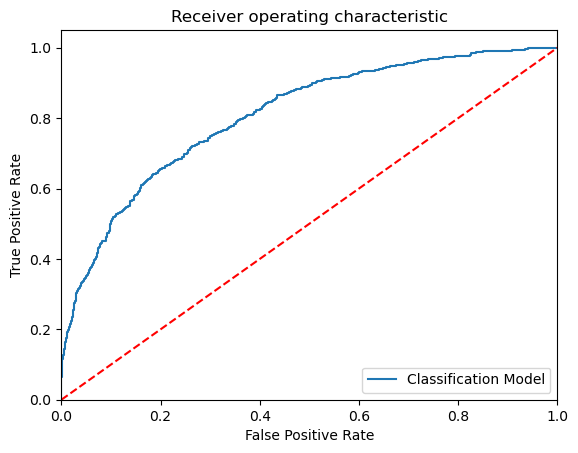

-----------------------------------------------------------------------------------------------------


In [55]:
# Training the Naive Bayes model (GaussianNB) on the Training set

from sklearn.naive_bayes import GaussianNB

modelGNB = GaussianNB(priors=None, var_smoothing=1e-09)

# Fit the model with train data

modelGNB.fit(x_train,y_train)

# Predict the model with test data set

y_pred = modelGNB.predict(x_test)
y_pred_prob = modelGNB.predict_proba(x_test)

# Confusion matrix in sklearn

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
print('Confusion matrix : \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
print('Outcome values : \n', tp, fn, fp, tn)

# classification report for precision, recall f1-score and accuracy

C_Report = classification_report(actual,predicted,labels=[1,0])

print('Classification report : \n', C_Report)

# calculating the metrics

sensitivity = round(tp/(tp+fn), 3);
specificity = round(tn/(tn+fp), 3);
accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
balanced_accuracy = round((sensitivity+specificity)/2, 3);
precision = round(tp/(tp+fp), 3);
f1Score = round((2*tp/(2*tp + fp + fn)), 3);

# Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
# A model with a score of +1 is a perfect model and -1 is a poor model

from math import sqrt

mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

print('Accuracy :', round(accuracy*100, 2),'%')
print('Precision :', round(precision*100, 2),'%')
print('Recall :', round(sensitivity*100,2), '%')
print('F1 Score :', f1Score)
print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
print('MCC :', MCC)

# Area under ROC curve 

from sklearn.metrics import roc_curve, roc_auc_score

print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))

# ROC Curve

from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
model_roc_auc = roc_auc_score(actual, predicted)
fpr, tpr, thresholds = roc_curve(actual,modelGNB.predict_proba(x_test)[:,1])
plt.figure()
# plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show() 
print('-----------------------------------------------------------------------------------------------------')

# COMPARE THE CLASSIFICATION ALGORITHM

In [48]:
#Load the data
EMResults=pd.read_csv(r"C:\Users\dlc\Desktop\D5\EMResults (1).csv",header=0)
#Display the data
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


Model Name:  LogisticRegression()
Confusion matrix : 
 [[ 111  473]
 [  73 2343]]
Outcome values : 
 111 473 73 2343
Classification report : 
               precision    recall  f1-score   support

           1       0.60      0.19      0.29       584
           0       0.83      0.97      0.90      2416

    accuracy                           0.82      3000
   macro avg       0.72      0.58      0.59      3000
weighted avg       0.79      0.82      0.78      3000

Accuracy : 81.8 %
Precision : 60.3 %
Recall : 19.0 %
F1 Score : 0.289
Specificity or True Negative Rate : 97.0 %
Balanced Accuracy : 58.0 %
MCC : 0.264
roc_auc_score: 0.58


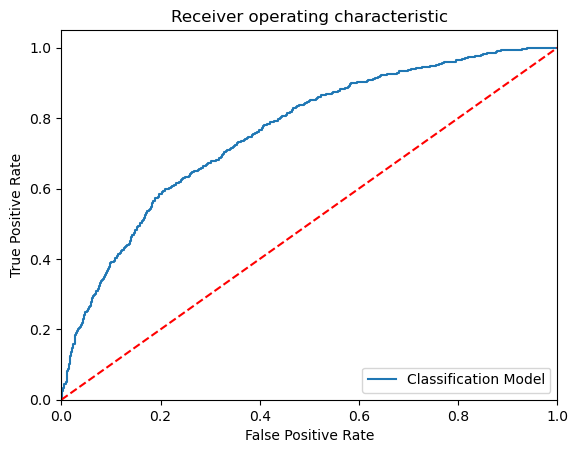

-----------------------------------------------------------------------------------------------------
Model Name:  DecisionTreeClassifier()
Confusion matrix : 
 [[ 299  285]
 [ 353 2063]]
Outcome values : 
 299 285 353 2063
Classification report : 
               precision    recall  f1-score   support

           1       0.46      0.51      0.48       584
           0       0.88      0.85      0.87      2416

    accuracy                           0.79      3000
   macro avg       0.67      0.68      0.67      3000
weighted avg       0.80      0.79      0.79      3000

Accuracy : 78.7 %
Precision : 45.9 %
Recall : 51.2 %
F1 Score : 0.484
Specificity or True Negative Rate : 85.4 %
Balanced Accuracy : 68.3 %
MCC : 0.351
roc_auc_score: 0.683


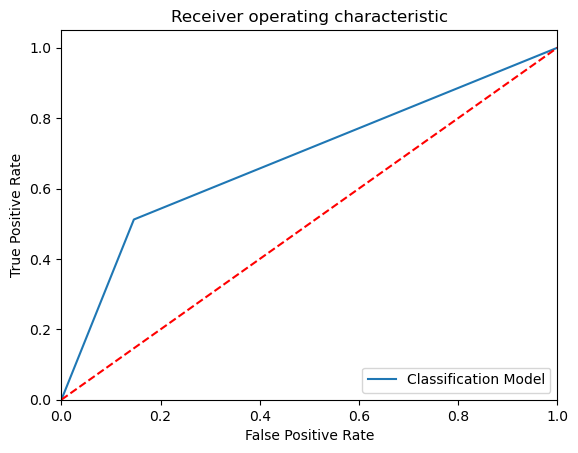

-----------------------------------------------------------------------------------------------------
Model Name:  RandomForestClassifier()
Confusion matrix : 
 [[ 259  325]
 [  79 2337]]
Outcome values : 
 259 325 79 2337
Classification report : 
               precision    recall  f1-score   support

           1       0.77      0.44      0.56       584
           0       0.88      0.97      0.92      2416

    accuracy                           0.87      3000
   macro avg       0.82      0.71      0.74      3000
weighted avg       0.86      0.87      0.85      3000

Accuracy : 86.5 %
Precision : 76.6 %
Recall : 44.3 %
F1 Score : 0.562
Specificity or True Negative Rate : 96.7 %
Balanced Accuracy : 70.5 %
MCC : 0.514
roc_auc_score: 0.705


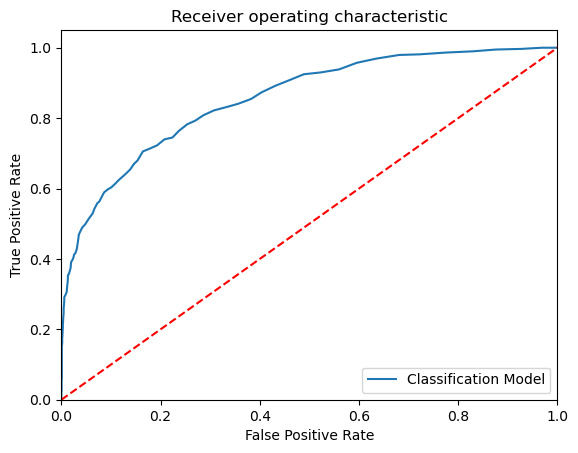

-----------------------------------------------------------------------------------------------------
Model Name:  ExtraTreesClassifier()
Confusion matrix : 
 [[ 239  345]
 [  62 2354]]
Outcome values : 
 239 345 62 2354
Classification report : 
               precision    recall  f1-score   support

           1       0.79      0.41      0.54       584
           0       0.87      0.97      0.92      2416

    accuracy                           0.86      3000
   macro avg       0.83      0.69      0.73      3000
weighted avg       0.86      0.86      0.85      3000

Accuracy : 86.4 %
Precision : 79.4 %
Recall : 40.9 %
F1 Score : 0.54
Specificity or True Negative Rate : 97.4 %
Balanced Accuracy : 69.2 %
MCC : 0.506
roc_auc_score: 0.692


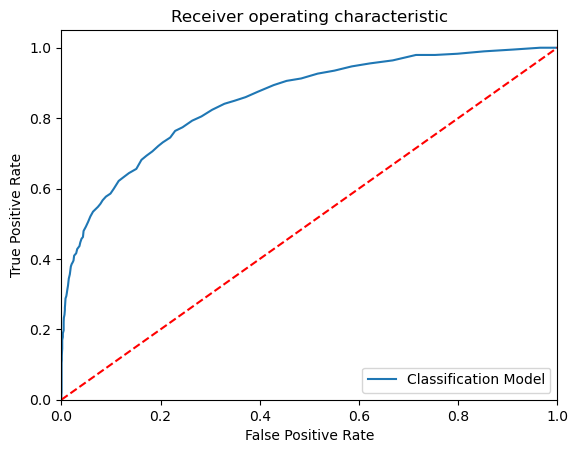

-----------------------------------------------------------------------------------------------------
Model Name:  KNeighborsClassifier()
Confusion matrix : 
 [[ 125  459]
 [ 127 2289]]
Outcome values : 
 125 459 127 2289
Classification report : 
               precision    recall  f1-score   support

           1       0.50      0.21      0.30       584
           0       0.83      0.95      0.89      2416

    accuracy                           0.80      3000
   macro avg       0.66      0.58      0.59      3000
weighted avg       0.77      0.80      0.77      3000

Accuracy : 80.5 %
Precision : 49.6 %
Recall : 21.4 %
F1 Score : 0.299
Specificity or True Negative Rate : 94.7 %
Balanced Accuracy : 58.0 %
MCC : 0.23
roc_auc_score: 0.581


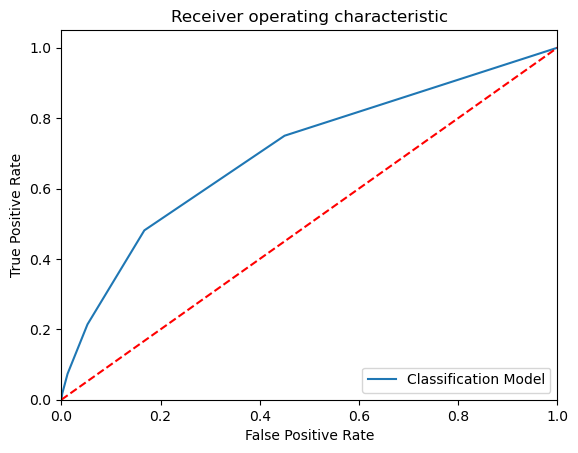

-----------------------------------------------------------------------------------------------------
Model Name:  SVC(class_weight='balanced', kernel='linear', probability=True, random_state=42)
Confusion matrix : 
 [[ 411  173]
 [ 748 1668]]
Outcome values : 
 411 173 748 1668
Classification report : 
               precision    recall  f1-score   support

           1       0.35      0.70      0.47       584
           0       0.91      0.69      0.78      2416

    accuracy                           0.69      3000
   macro avg       0.63      0.70      0.63      3000
weighted avg       0.80      0.69      0.72      3000

Accuracy : 69.3 %
Precision : 35.5 %
Recall : 70.4 %
F1 Score : 0.472
Specificity or True Negative Rate : 69.0 %
Balanced Accuracy : 69.7 %
MCC : 0.321
roc_auc_score: 0.697


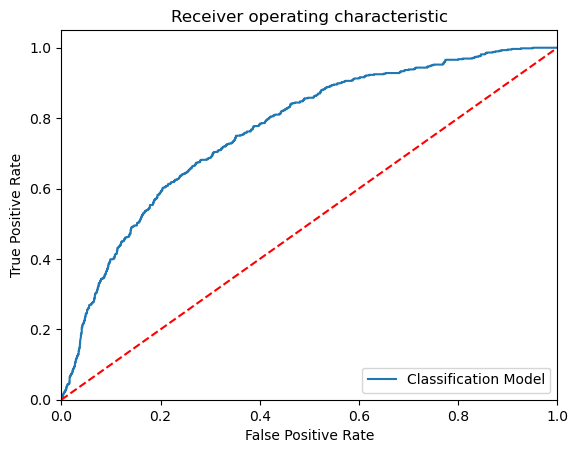

-----------------------------------------------------------------------------------------------------


In [56]:

# Build the Calssification models and compare the results

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Create objects of classification algorithm with default hyper-parameters

ModelLR = LogisticRegression()
ModelDC = DecisionTreeClassifier()
ModelRF = RandomForestClassifier()
ModelET = ExtraTreesClassifier()
ModelKNN = KNeighborsClassifier(n_neighbors=5)
ModelSVM = SVC(kernel='linear', random_state = 42, class_weight='balanced', probability=True)

# Evalution matrix for all the algorithms

MM = [ModelLR, ModelDC, ModelRF, ModelET, ModelKNN, ModelSVM]

for models in MM:
    
    # Fit the model
    
    models.fit(x_train, y_train)
    
    # Prediction
    
    y_pred = models.predict(x_test)
    y_pred_prob = models.predict_proba(x_test)
    
    # Print the model name
    
    print('Model Name: ', models)
    
    # confusion matrix in sklearn

    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import classification_report

    # actual values

    actual = y_test

    # predicted values

    predicted = y_pred

    # confusion matrix

    matrix = confusion_matrix(actual,predicted, labels=[1,0],sample_weight=None, normalize=None)
    print('Confusion matrix : \n', matrix)

    # outcome values order in sklearn

    tp, fn, fp, tn = confusion_matrix(actual,predicted,labels=[1,0]).reshape(-1)
    print('Outcome values : \n', tp, fn, fp, tn)

    # classification report for precision, recall f1-score and accuracy

    C_Report = classification_report(actual,predicted,labels=[1,0])

    print('Classification report : \n', C_Report)

    # calculating the metrics

    sensitivity = round(tp/(tp+fn), 3);
    specificity = round(tn/(tn+fp), 3);
    accuracy = round((tp+tn)/(tp+fp+tn+fn), 3);
    balanced_accuracy = round((sensitivity+specificity)/2, 3);
    
    precision = round(tp/(tp+fp), 3);
    f1Score = round((2*tp/(2*tp + fp + fn)), 3);

    # Matthews Correlation Coefficient (MCC). Range of values of MCC lie between -1 to +1. 
    # A model with a score of +1 is a perfect model and -1 is a poor model

    from math import sqrt

    mx = (tp+fp) * (tp+fn) * (tn+fp) * (tn+fn)
    MCC = round(((tp * tn) - (fp * fn)) / sqrt(mx), 3)

    print('Accuracy :', round(accuracy*100, 2),'%')
    print('Precision :', round(precision*100, 2),'%')
    print('Recall :', round(sensitivity*100,2), '%')
    print('F1 Score :', f1Score)
    print('Specificity or True Negative Rate :', round(specificity*100,2), '%'  )
    print('Balanced Accuracy :', round(balanced_accuracy*100, 2),'%')
    print('MCC :', MCC)

    # Area under ROC curve 

    from sklearn.metrics import roc_curve, roc_auc_score

    print('roc_auc_score:', round(roc_auc_score(actual, predicted), 3))
    
    # ROC Curve
    
    from sklearn.metrics import roc_auc_score
    from sklearn.metrics import roc_curve
    model_roc_auc = roc_auc_score(actual, predicted)
    fpr, tpr, thresholds = roc_curve(actual, models.predict_proba(x_test)[:,1])
    plt.figure()
    # plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
    plt.plot(fpr, tpr, label= 'Classification Model' % model_roc_auc)
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.savefig('Log_ROC')
    plt.show()
    print('-----------------------------------------------------------------------------------------------------')
    #---
    new_row = {'Model Name' : models,
               'True_Positive' : tp, 
               'False_Negative' : fn, 
               'False_Positive' : fp,
               'True_Negative' : tn,
               'Accuracy' : accuracy,
               'Precision' : precision,
               'Recall' : sensitivity,
               'F1 Score' : f1Score,
               'Specificity' : specificity,
               'MCC':MCC,
               'ROC_AUC_Score':roc_auc_score(actual, predicted),
               'Balanced Accuracy':balanced_accuracy}
    EMResults1 = EMResults1.append(new_row, ignore_index=True)
    #------------------------------------------------------------------------------------------------------------------


In [63]:
#Display the data
EMResults.head()

,Model Name,True_Positive,False_Negative,False_Positive,True_Negative,Accuracy,Precision,Recall,F1 Score,Specificity,MCC,ROC_AUC_Score,Balanced Accuracy


In [64]:
#predict the values with knn algorithm
y_predRF=ModelRF.predict(x_test)

In [69]:
#Results(Run upto here only)
Results=pd.DataFrame({'Exited_A':y_test, 'Exited_P':y_predRF})
# Merge two Dataframes on index of both the dataframes
ResultsFinal=BCChurn_bk1.merge(Results, left_index=True, right_index=True)
# Display 10 records randomly
ResultsFinal.sample(10)

,RowNumber,CustomerId,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Exited_A,Exited_P
7834,7835,15797165,703,France,Male,56,9,0.00,1,0,0,85547.33,1,1,1
711,712,15650288,634,Germany,Male,35,6,116269.01,1,1,0,129964.94,0,0,0
9643,9644,15709354,521,France,Female,41,2,0.00,2,1,1,113089.43,0,0,0
3122,3123,15575002,676,France,Male,29,4,140720.93,1,1,0,36221.18,0,0,0
4848,4849,15807167,635,France,Male,42,1,146766.72,2,0,1,164357.10,0,0,0
4519,4520,15713769,617,Spain,Male,38,7,0.00,1,1,1,27239.28,0,0,0
3393,3394,15600626,710,France,Male,30,6,0.00,2,1,1,8991.17,0,0,0
3834,3835,15704819,734,Spain,Female,39,6,92126.26,2,0,0,112973.34,0,0,0
8165,8166,15813503,606,Spain,Male,37,8,154712.58,2,1,0,89099.18,0,0,0
9044,9045,15653347,560,Spain,Male,47,1,0.00,1,0,0,128882.66,1,1,0
